In [1]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from fbprophet import Prophet
import os

In [2]:
#ignore warning
import warnings
warnings.filterwarnings('ignore')

In [3]:
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
# Connect to the AWS cloud database and download the data.
%run Connect_Database.ipynb

Enter database password········
('INTC', 16.9, 4.4, 5.6, 6.9, datetime.datetime(2022, 2, 1, 0, 0), 'UNDER_PERF', 'Semiconductors', 3.0, 31, 14.57, 'Customer Incidents,Business Ethics Incidents', 11.6, 21.21967741935484, 32.93, 2.53, 8.044999999999998, 16.08, 2.62, 6.166333333333333, 9.51, 4.79, 6.668666666666666, 9.67, 0.0, 1.1290322580645162, 4.0, 'None')


In [5]:
# Checking the company profile including esg 
esg_info_df

,Ticker,totalScore,eScore,sScore,gScore,lastRated,esgPerformance,peerGroup,highestControversy,peerCount,totalPercentile,relatedControversy,minPeerESG,avgPeerESG,maxPeerESG,minPeerEnvironment,avgPeerEnvironment,maxPeerEnvironment,minPeerSocial,avgPeerSocial,maxPeerSocial,minPeerGovernance,avgPeerGovernance,maxPeerGovernance,minHighestControversy,avgHighestControversy,maxHighestControversy,controversialBusinessAreas,Ticker_1,longName,sector,industry,city,state,country,fullTimeEmployees,revenueGrowth,forwardEps,beta,priceToSalesTrailing12Months,forwardPE,dividendRate,trailingPE,bookValue,returnOnAssets,returnOnEquity,averageVolume,volume,currentPrice,fiftyTwoWeekLow,fiftyTwoWeekHigh,regularMarketPrice,marketCap
0,INTC,16.9,4.4,5.6,6.9,2022-02-01,UNDER_PERF,Semiconductors,3.0,31,14.57,"Customer Incidents,Business Ethics Incidents",11.60,21.219677,32.93,2.53,8.045000,16.08,2.62,6.166333,9.51,4.79,6.668667,9.67,0.0,1.129032,4.0,None,INTC,Intel Corporation,Technology,Semiconductors,Santa Clara,CA,United States,121100,0.028,3.70,0.549019,2.435918,12.724324,1.46,9.687242,23.438,0.08586,0.22522,39406317,11318373,47.0800,43.630000,68.49000,47.0800,192495992832
1,MSFT,13.3,0.5,8.1,4.7,2022-02-01,UNDER_PERF,Software & Services,3.0,105,6.32,Customer Incidents,9.45,18.121714,49.81,0.01,1.226602,5.35,3.90,9.897476,21.01,3.83,7.004078,34.36,0.0,1.561905,5.0,None,MSFT,Microsoft Corporation,Technology,Software & Services,Redmond,WA,United States,181000,0.201,10.73,0.908333,12.059670,27.720411,2.48,31.679626,21.335,0.15249,0.49051,37917035,12921472,297.4400,238.070000,349.67000,297.4400,2229868953600
2,AAPL,16.3,0.6,6.9,8.8,2022-02-01,UNDER_PERF,Technology Hardware,3.0,55,12.87,"Social Supply Chain Incidents,Customer Inciden...",7.24,16.519455,25.70,0.03,3.164815,8.67,2.24,6.233889,12.55,3.45,7.292593,12.13,0.0,1.490909,4.0,None,AAPL,Apple Inc.,Technology,Technology Hardware,Cupertino,CA,United States,100000,0.112,6.57,1.187745,7.326676,25.852360,0.88,28.237741,4.402,0.19875,1.45567,94023840,50570900,169.8500,122.250000,182.94000,169.8500,2771850100736
3,NVDA,12.8,2.5,4.1,6.1,2022-02-01,UNDER_PERF,Semiconductors,2.0,31,5.40,Customer Incidents,11.60,21.219677,32.93,2.53,8.045000,16.08,2.62,6.166333,9.51,4.79,6.668667,9.67,0.0,1.129032,4.0,None,NVDA,NVIDIA Corporation,Technology,Semiconductors,Santa Clara,CA,United States,22473,0.528,6.79,1.423039,21.410793,34.055965,0.16,60.062340,10.619,0.17199,0.44832,53711866,38802269,231.2400,134.590000,346.47000,231.2400,576250118144
4,VZ,16.7,1.7,9.3,5.7,2022-02-01,UNDER_PERF,Telecommunication Services,3.0,68,14.01,Customer Incidents,11.96,22.094559,34.77,1.21,3.947742,7.69,4.64,10.598871,15.60,3.32,6.936774,8.91,0.0,1.823529,5.0,None,VZ,Verizon Communications Inc.,Communication Services,Telecommunication Services,New York,NY,United States,118400,-0.018,5.63,0.368137,1.678736,9.485790,2.56,10.040422,19.484,0.05324,0.29668,24657250,16078096,53.4050,49.690000,59.85000,53.4050,224300990464
5,CSCO,11.8,0.0,5.6,6.2,2022-02-01,UNDER_PERF,Technology Hardware,2.0,55,4.01,"Social Supply Chain Incidents,Customer Inciden...",7.24,16.519455,25.70,0.03,3.164815,8.67,2.24,6.233889,12.55,3.45,7.292593,12.13,0.0,1.490909,4.0,None,CSCO,"Cisco Systems, Inc.",Technology,Technology Hardware,San Jose,CA,United States,79500,0.064,3.73,0.946568,4.377476,14.563003,1.52,19.400000,9.515,0.09281,0.30082,22131427,10552131,54.3200,50.100000,64.29000,54.3200,225654521856
6,EXC,24.4,9.1,9.0,6.3,2022-02-01,AVG_PERF,Utilities,3.0,107,39.67,Public Policy Incidents,10.45,29.262523,68.15,1.60,13.008932,28.85,3.03,9.480485,29.76,3.50,6.504175,10.05,0.0,1.775701,5.0,"Nuclear,",EXC,Exelon Corporation,Utilities,Utilities,Chicago,IL,United States,32340,0.006,3.32,0.481849,1.408672,15.105422,1.35,29.327486,34.601,0.02479,0.05409,10876622,3290691,50.1500,30.527817,50.28000,50.1500,49062649856
7,PEP,16.0,4.9,6.6,4.6,2022-02-01,UNDER_PERF,Food Products,3.0,94,12.12,Social Supply Chain Incidents,14.16,27.795213,48.86,3.65,10.150556,22.18,4.39,10.959222,

In [6]:
# Historical data on company stocks
stocks_df

,Ticker,Date,Open,High,Low,Close,Adj Close,Volume
0,INTC,2017-03-16,35.169998,35.360001,35.070000,35.139999,31.572710,19616100.0
1,INTC,2017-03-17,35.310001,35.330002,35.099998,35.270000,31.689518,30778900.0
2,INTC,2017-03-20,35.369999,35.630001,35.259998,35.430000,31.833265,17322300.0
3,INTC,2017-03-21,35.590000,35.599998,35.000000,35.040001,31.482866,22814500.0
4,INTC,2017-03-22,35.220001,35.459999,35.000000,35.369999,31.779369,19144500.0
...,...,...,...,...,...,...,...,...
69240,EMN,2022-03-09,107.809998,109.629997,107.349998,108.709999,108.709999,2445400.0
69241,EMN,2022-03-10,107.580002,107.889999,105.760002,106.889999,106.889999,1750700.0
69242,EMN,2022-03-11,107.440002,107.660004,105.389999,105.419998,105.419998,1610800.0
69243,EMN,2022-03-14,105.839996,107.209999,104.370003,106.080002,106.080002,1504800.0


In [7]:
# Selecting the type of tickers you want to predict
names = esg_info_df['Ticker'].tolist()

In [8]:
# Function to concatenate the date, stock price, and volume in one dataframe for a single stock
def each_ticker(df, name):
    stocks_df = df[df['Ticker'] == name]
    stocks_df.drop(['Ticker', 'Open', 'Adj Close', 'High', 'Low','Volume'], axis =1, inplace = True)
    stocks_df.rename(columns = {'Date':'ds', 'Close': 'y', }, inplace = True)
    return stocks_df

In [9]:
# Create a dataframe for one Ticker
name = 'EMN'
data = each_ticker(stocks_df, name)
data

,ds,y
67986,2017-03-16,78.889999
67987,2017-03-17,79.169998
67988,2017-03-20,78.830002
67989,2017-03-21,77.500000
67990,2017-03-22,77.820000
...,...,...
69240,2022-03-09,108.709999
69241,2022-03-10,106.889999
69242,2022-03-11,105.419998
69243,2022-03-14,106.080002


In [10]:
#show the information and descriptions of the data collected
print(data.info())
data.describe()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1259 entries, 67986 to 69244
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      1259 non-null   datetime64[ns]
 1   y       1259 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 29.5 KB
None


,y
count,1259.000000
mean,90.126704
std,18.043779
min,38.389999
25%,77.095001
50%,85.480003
75%,105.195000
max,130.029999


### First Model without any user defined features

In [11]:
# Create the model 
model = Prophet(daily_seasonality = True)

# Fit the data into model
model.fit(data)

# Create the dataframe of target values that is Close values from start date of stock values to 365 days in future
future = model.make_future_dataframe(periods = 365)

# Predict the future Close values
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1619,2023-03-11,115.595908,77.007344,152.989317
1620,2023-03-12,115.220822,74.568111,152.459167
1621,2023-03-13,114.659116,73.931079,151.124263
1622,2023-03-14,114.424004,74.297447,150.157698
1623,2023-03-15,114.086383,74.184598,152.211160


In [12]:
# Plot the forecast
from fbprophet.plot import plot_plotly, plot_components_plotly
plot_plotly(model, forecast)    

In [13]:
# Cross validation of the predicted values
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon = '365 days')

# Create the performance metrics
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00


,horizon,mse,rmse,mae,mape,mdape,coverage
0,36 days,153.883023,12.404960,10.661036,0.162544,0.143412,0.213333
1,37 days,157.912335,12.566317,10.844652,0.164365,0.143412,0.200000
2,38 days,157.682631,12.557174,10.862098,0.164498,0.117800,0.200000
3,39 days,151.091415,12.291925,10.664607,0.157588,0.112040,0.200000
4,40 days,149.518052,12.227757,10.621261,0.153726,0.112040,0.200000
...,...,...,...,...,...,...,...
325,361 days,3058.576265,55.304396,54.749999,0.481300,0.460453,0.000000
326,362 days,3073.414911,55.438388,54.851112,0.482344,0.460453,0.000000
327,363 days,3084.857574,55.541494,54.899619,0.482870,0.460453,0.000000
328,364 days,3123.328614,55.886748,55.189111,0.485801,0.479864,0.000000


In [14]:
# Checkout the max, min, median etc. for performance metrics
df_p.describe()

,horizon,mse,rmse,mae,mape,mdape,coverage
count,330,330.000000,330.000000,330.000000,330.000000,330.000000,330.000000
mean,200 days 12:00:00,1376.344020,34.577467,32.689767,0.310872,0.294733,0.069569
std,95 days 09:46:06.770119357,888.781477,13.464479,14.487260,0.116424,0.131797,0.128939
min,36 days 00:00:00,131.877483,11.483792,9.512743,0.108508,0.054772,0.000000
25%,118 days 06:00:00,536.507777,23.162632,19.388580,0.199988,0.151259,0.000000
50%,200 days 12:00:00,1476.063518,38.419052,35.884767,0.351705,0.355590,0.000000
75%,282 days 18:00:00,2179.878776,46.689164,46.441809,0.413379,0.416127,0.066667
max,365 days 00:00:00,3127.341775,55.922641,55.189111,0.486636,0.479864,0.440000


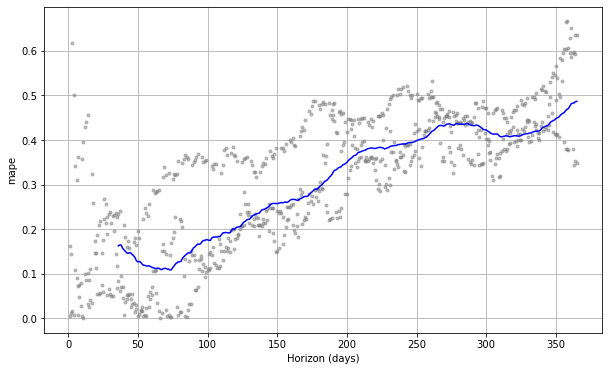

In [15]:
# Plot the mape values from cross validation
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')  


### Second Model with defined model parameters , seasonality etc.

In [16]:
# define the forecasting model parameters, trend = logistic growth, yearly seasonality = multiplicative, no holiday parameter
model_params = {
   "daily_seasonality": False,
   "weekly_seasonality": False,
   "yearly_seasonality": True,
   "seasonality_mode": "multiplicative",
   "growth": "logistic"
}

# define the forecasting model and set the cap
model = Prophet(**model_params)

# Setting the cap for logistic growth
data['cap'] = data['y'].max() + data['y'].std() * 0.05

# add seasonailty to the model
model = model.add_seasonality(name = 'monthly' , period = 30 , fourier_order= 10)
model = model.add_seasonality(name = 'quarterly' , period =  92.25, fourier_order= 10)

# Fitting the data 
model.fit(data)

# creating the target 
future = model.make_future_dataframe(periods = 365)
future['cap'] = data['cap'].max()

# Predict the forecast
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
1619,2023-03-11,126.184049,116.918593,134.544821
1620,2023-03-12,126.422027,118.651778,135.038494
1621,2023-03-13,126.675133,118.049477,135.521659
1622,2023-03-14,126.410035,117.043801,134.934516
1623,2023-03-15,126.296120,117.021167,134.711704


In [17]:
# Checking out the forecast dataframe
forecast

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,monthly,monthly_lower,monthly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,quarterly,quarterly_lower,quarterly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2017-03-16,77.261064,130.932188,66.690188,84.587897,77.261064,77.261064,0.000588,0.000588,0.000588,-0.022748,-0.022748,-0.022748,-0.014432,-0.014432,-0.014432,-0.008905,-0.008905,-0.008905,0.0,0.0,0.0,75.503508
1,2017-03-17,77.325675,130.932188,67.876416,84.034346,77.325675,77.325675,0.001695,0.001695,0.001695,-0.021704,-0.021704,-0.021704,-0.013353,-0.013353,-0.013353,-0.010047,-0.010047,-0.010047,0.0,0.0,0.0,75.647379
2,2017-03-20,77.519365,130.932188,66.777670,83.791353,77.519365,77.519365,-0.003743,-0.003743,-0.003743,-0.025527,-0.025527,-0.025527,-0.010661,-0.010661,-0.010661,-0.011123,-0.011123,-0.011123,0.0,0.0,0.0,75.540544
3,2017-03-21,77.583880,130.932188,67.477011,84.682596,77.583880,77.583880,0.001419,0.001419,0.001419,-0.019459,-0.019459,-0.019459,-0.010159,-0.010159,-0.010159,-0.010719,-0.010719,-0.010719,0.0,0.0,0.0,76.074155
4,2017-03-22,77.648371,130.932188,67.858781,84.590877,77.648371,77.648371,-0.000503,-0.000503,-0.000503,-0.019808,-0.019808,-0.019808,-0.009341,-0.009341,-0.009341,-0.009964,-0.009964,-0.009964,0.0,0.0,0.0,76.110315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1619,2023-03-11,129.499451,130.932188,116.918593,134.544821,128.950148,129.895693,-0.001891,-0.001891,-0.001891,-0.025602,-0.025602,-0.025602,-0.027172,-0.027172,-0.027172,0.003461,0.003461,0.003461,0.0,0.0,0.0,126.184049
1620,2023-03-12,129.505596,130.932188,118.651778,135.038494,128.957086,129.901363,0.001507,0.001507,0.001507,-0.023810,-0.023810,-0.023810,-0.025902,-0.025902,-0.025902,0.000585,0.000585,0.000585,0.0,0.0,0.0,126.422027
1621,2023-03-13,129.511716,130.932188,118.049477,135.521659,128.963080,129.906982,0.003943,0.003943,0.003943,-0.021902,-0.021902,-0.021902,-0.023784,-0.023784,-0.023784,-0.002061,-0.002061,-0.002061,0.0,0.0,0.0,126.675133
1622,2023-03-14,129.517809,130.932188,117.043801,134.934516,128.969056,129.912943,0.001779,0.001779,0.001779,-0.023995,-0.023995,-0.023995,-0.021343,-0.021343,-0.021343,-0.004431,-0.004431,-0.004431,0.0,0.0,0.0,126.410035


In [18]:
# Plot the forecast
from fbprophet.plot import plot_plotly, plot_components_plotly
plot_plotly(model, forecast)

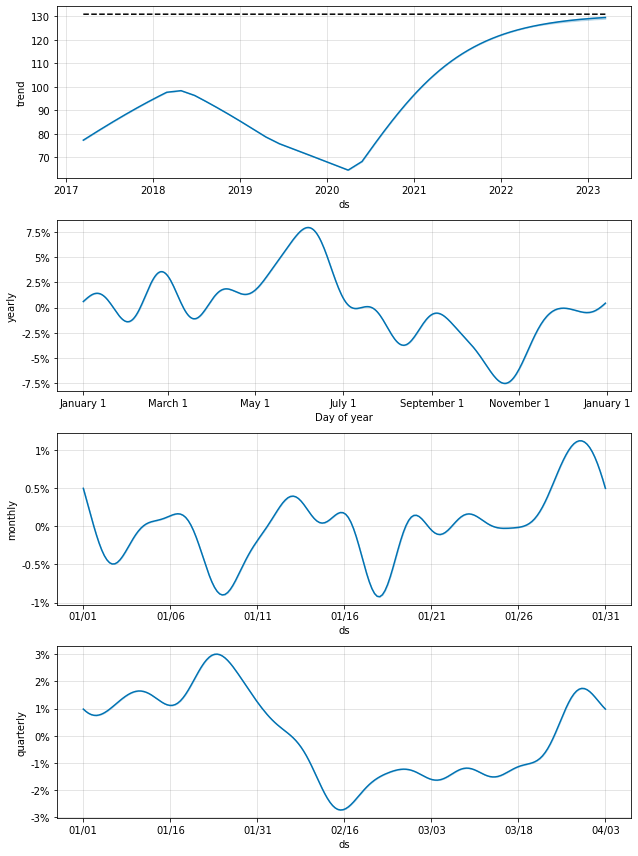

In [19]:
# Save the forecast plot
model.plot_components(forecast).savefig(f'Images/{name}.png')

In [20]:
# cross validate the forecast
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon = '365 days')

INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00


In [21]:
# Checkout the cross validated forecast
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-03-23,66.165067,59.693991,72.803159,38.389999,2020-03-20
1,2020-03-24,66.693578,60.143914,73.438489,41.580002,2020-03-20
2,2020-03-25,67.631344,60.580597,74.025898,46.580002,2020-03-20
3,2020-03-26,68.150847,61.894222,74.467753,47.950001,2020-03-20
4,2020-03-27,68.976122,62.394985,75.515706,46.470001,2020-03-20
...,...,...,...,...,...,...
751,2022-03-09,131.177065,123.533275,139.439445,108.709999,2021-03-15
752,2022-03-10,131.146239,122.577713,139.098752,106.889999,2021-03-15
753,2022-03-11,130.438294,121.670838,137.507506,105.419998,2021-03-15
754,2022-03-14,125.118028,116.429829,132.863232,106.080002,2021-03-15


In [22]:
# Checkout the performance maetrics
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,mdape,coverage
0,36 days,309.805533,17.601293,16.340228,0.243444,0.224421,0.133333
1,37 days,312.046150,17.664828,16.350027,0.243623,0.228316,0.146667
2,38 days,308.784064,17.572253,16.152884,0.242615,0.232165,0.160000
3,39 days,298.174754,17.267737,15.802959,0.234321,0.228316,0.173333
4,40 days,293.922469,17.144167,15.675372,0.229650,0.228316,0.173333
...,...,...,...,...,...,...,...
325,361 days,1870.861167,43.253453,38.879048,0.345005,0.439186,0.126667
326,362 days,1925.633756,43.882044,39.689715,0.352107,0.440151,0.113333
327,363 days,1958.693099,44.257125,40.144561,0.356248,0.443580,0.106667
328,364 days,1947.964017,44.135745,39.911414,0.354346,0.440151,0.106667


In [23]:
# Find out the min , max , percentile for errors
df_p.describe()

,horizon,mse,rmse,mae,mape,mdape,coverage
count,330,330.000000,330.000000,330.000000,330.000000,330.000000,330.000000
mean,200 days 12:00:00,1026.274243,30.787455,25.227759,0.242621,0.243961,0.261071
std,95 days 09:46:06.770119357,544.200641,8.868211,8.257486,0.061548,0.124735,0.141748
min,36 days 00:00:00,250.701339,15.833551,14.341693,0.157734,0.070945,0.053333
25%,118 days 06:00:00,558.580239,23.634284,16.938087,0.179133,0.132764,0.146667
50%,200 days 12:00:00,1056.217147,32.499482,26.210692,0.254480,0.215703,0.213333
75%,282 days 18:00:00,1481.362629,38.488410,32.053716,0.292604,0.385009,0.333333
max,365 days 00:00:00,1975.633556,44.448100,40.144561,0.356248,0.445479,0.586667


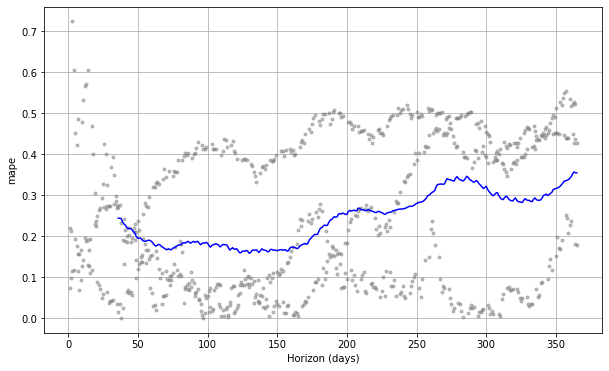

In [24]:
# Get the plot for MAPE
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')

### Both the model have almost the same performance. But the second one with additonal seasonality, logistic growth and yearly seasonality looks better. So we will use the second model. 'EMN' stock has one of the worst mean absolute percentage error (MAPE) values which is 24.2% on average. But, for the above one it was 31%. The prediction on 'EMN' is one of the worst ones and for many stocks the average is less than 10 %.

In [25]:
def generate_predictions(data, name):
    # Second Model with defined model parameters , seasonality
    # define the forecasting model parameters, trend = logistic growth, yearly seasonality = multiplicative, no holiday parameter
    model_params = {
       "daily_seasonality": False,
       "weekly_seasonality": False,
       "yearly_seasonality": True,
       "seasonality_mode": "multiplicative",
       "growth": "logistic"
    }

    # define the forecasting model and set the cap
    model = Prophet(**model_params)
#     model = Prophet(daily_seasonality = True)

    # Setting the cap for logistic growth
    data['cap'] = data['y'].max() + data['y'].std() * 0.05

    # add seasonaility to the model
    model = model.add_seasonality(name = 'monthly' , period = 30 , fourier_order= 10)
    model = model.add_seasonality(name = 'quarterly' , period =  92.25, fourier_order= 10)

    # Fitting the data 
    model.fit(data)

    # creating the target 
    future = model.make_future_dataframe(periods = 365)
    future['cap'] = data['cap'].max()

    forecast = model.predict(future)
    
    # Plot the forecast
    from fbprophet.plot import plot_plotly, plot_components_plotly
#     plot_plotly(model, forecast)
    
    # save the forecast plot
    model.plot_components(forecast).savefig(f'Images/forecast/{name}.png')

    # cross validate the forecast
    from fbprophet.diagnostics import cross_validation
    df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon = '365 days')
    
    from fbprophet.diagnostics import performance_metrics
    df_p = performance_metrics(df_cv)
    avg_mape = df_p['mape'].mean()
    
    # Plot the MAPE
    from fbprophet.plot import plot_cross_validation_metric
#     fig = plot_cross_validation_metric(df_cv, metric='mape')

    # Save the MAPE plot
    plot_cross_validation_metric(df_cv, metric='mape').savefig(f'Images/mape/{name}.png')
    
    return forecast[['ds', 'yhat']], avg_mape


INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbprophet:Making 3 forecasts with cutoffs between 2020-03-20 00:00:00 and 2021-03-15 00:00:00
INFO:fbpro

Average mape for all the stocks is: 0.15319351039177415


,Ticker,Date,forecast
0,INTC,2017-03-16,34.017834
1,INTC,2017-03-17,34.112291
2,INTC,2017-03-20,33.976928
3,INTC,2017-03-21,34.040435
4,INTC,2017-03-22,34.175217
...,...,...,...
1619,EMN,2023-03-11,126.184049
1620,EMN,2023-03-12,126.422027
1621,EMN,2023-03-13,126.675133
1622,EMN,2023-03-14,126.410035


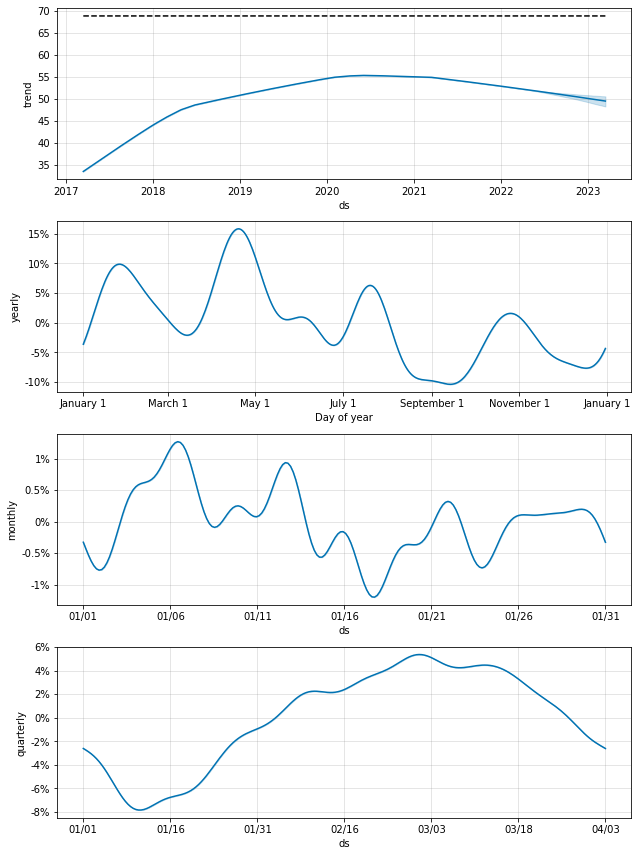

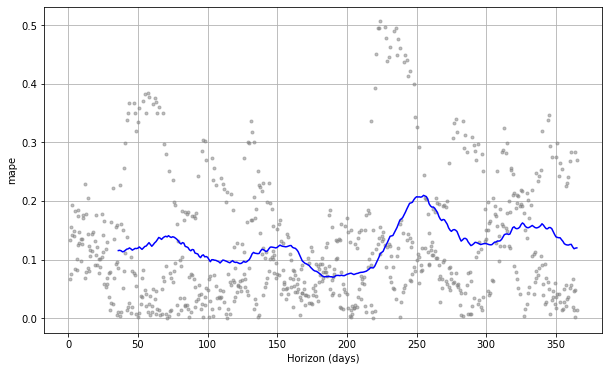

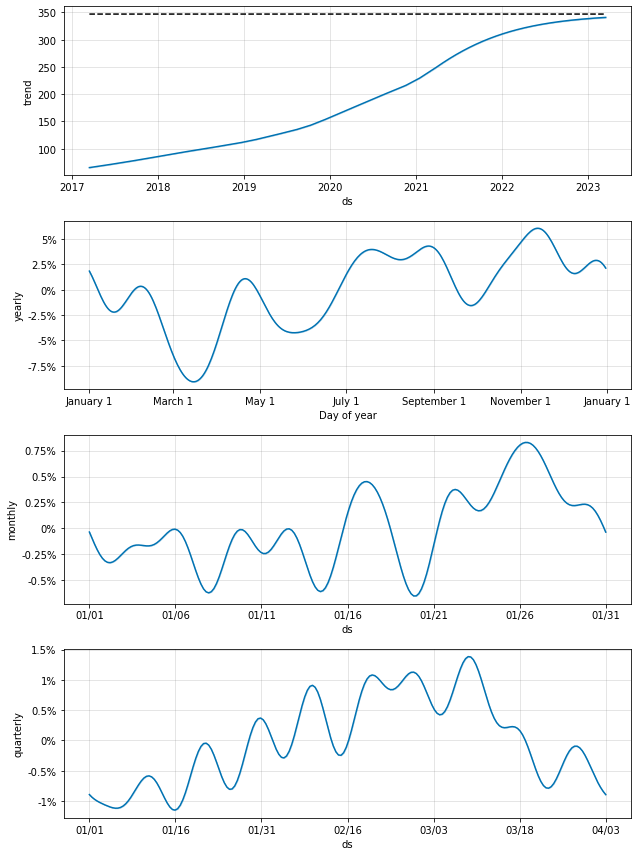

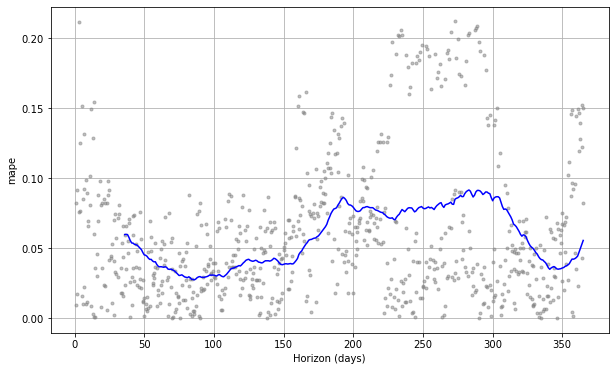

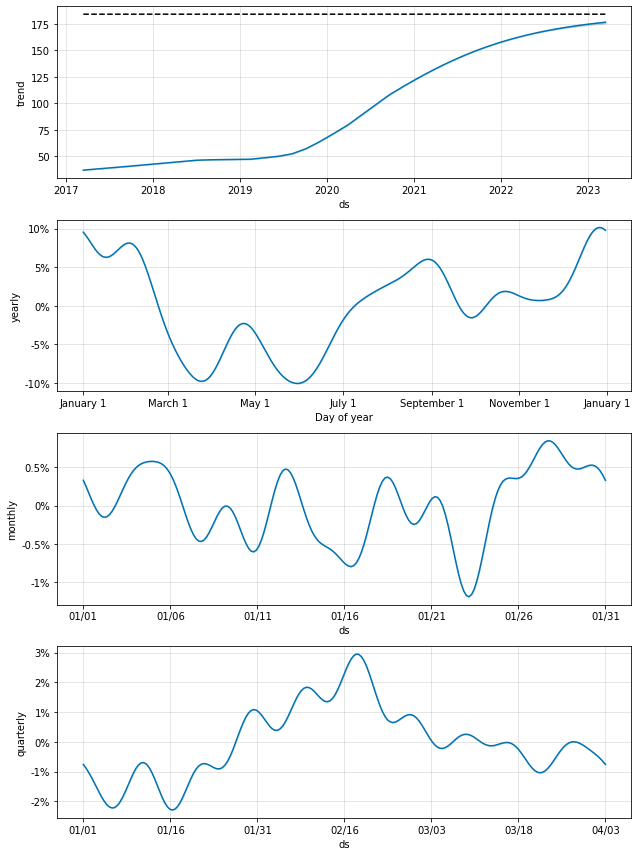

...

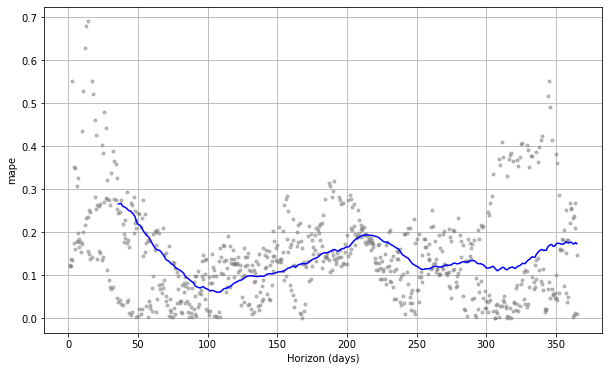

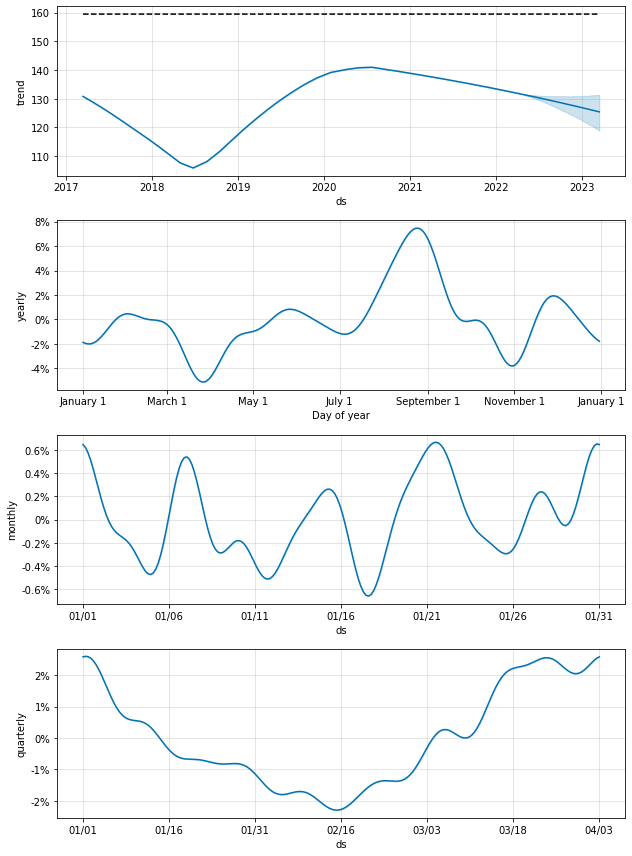

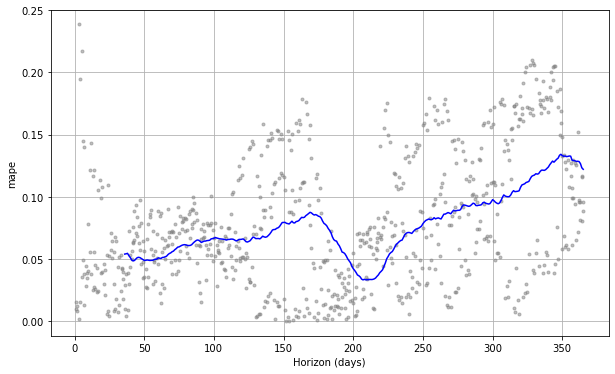

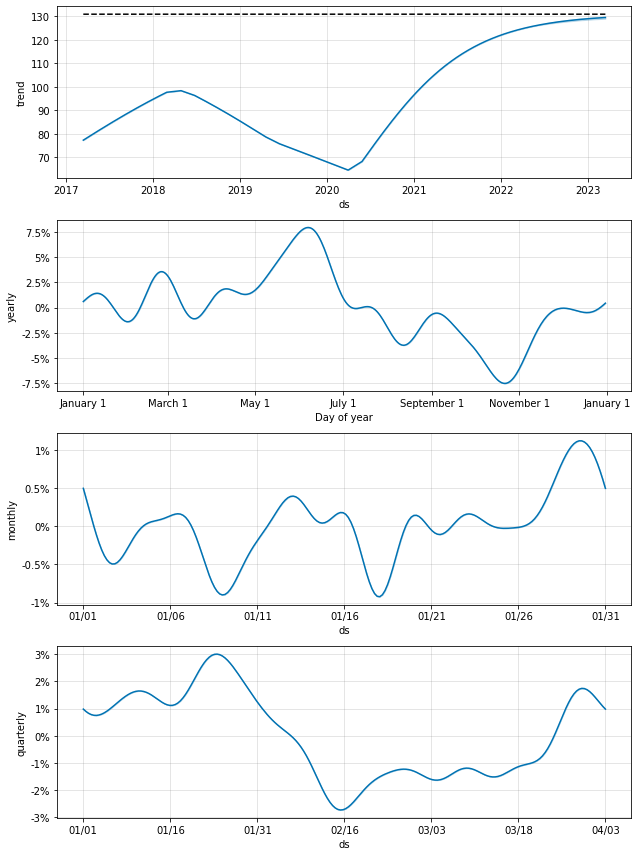

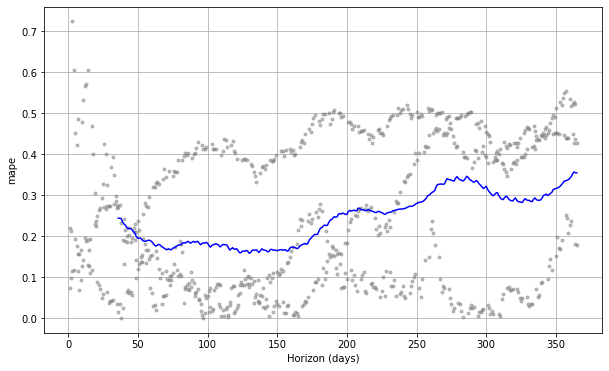

In [26]:
prediction = []
avg_mape = []
for name in names:
    data = each_ticker(stocks_df, name)
    df, mape_avg = generate_predictions(data, name)
    df.assign(Ticker = name)
    df.insert(0, 'Ticker', name)
    df.rename(columns = {'ds':'Date', 'yhat': 'forecast'}, inplace = True)
    prediction.append(df)
    avg_mape.append(mape_avg)
    

# Average mape of all the stocks

average_mape = sum(avg_mape)/len(avg_mape)

print(f"Average mape for all the stocks is: {average_mape}")

# see pd.concat documentation for more info
prediction_df = pd.concat(prediction)
prediction_df

In [27]:
avg_mape
print(f"Average mape for all the stocks is: {average_mape}")

Average mape for all the stocks is: 0.15319351039177415


In [28]:
# Modify the prediction_df to tbe written as a table
prediction_df.sort_values(by=['Date'],ignore_index=True)
print(prediction_df.shape)
print(prediction_df.dtypes)
prediction_df

(89320, 3)
Ticker              object
Date        datetime64[ns]
forecast           float64
dtype: object


,Ticker,Date,forecast
0,INTC,2017-03-16,34.017834
1,INTC,2017-03-17,34.112291
2,INTC,2017-03-20,33.976928
3,INTC,2017-03-21,34.040435
4,INTC,2017-03-22,34.175217
...,...,...,...
1619,EMN,2023-03-11,126.184049
1620,EMN,2023-03-12,126.422027
1621,EMN,2023-03-13,126.675133
1622,EMN,2023-03-14,126.410035


In [29]:
from sqlalchemy import Table, Column, String, Date, Float

predictions = Table(
   'predictions', metadata, 
   Column('ticker', String, primary_key = True), 
   Column('Date', Date, primary_key = True), 
   Column('forecast', Float, nullable=False),
)

metadata.create_all(engine)

# Write DataFrame to active_user table in RDS
prediction_df.to_sql('predictions', con=conn, if_exists='replace', index=False)

In [30]:
# Get the name of the table. 
inspector = inspect(engine)
inspector.get_table_names()

['stocks',
 'controversy_type',
 'business_controversy',
 'predictions',
 'esg_full',
 'stock_details']

In [31]:
# Execute a connection string
data = engine.execute("SELECT * FROM predictions LIMIT 1")
for record in data:
    print(record)

('INTC', datetime.datetime(2017, 3, 16, 0, 0), 34.01783372153334)


In [32]:
# Save predictions
file_to_save = os.path.join("Resources", "predictions.csv")
prediction_df.to_csv(file_to_save, index = False)

# Benefits

1. It does not require much prior knowledge of forecasting time series data as it can automatically find seasonal trends with a set of data and offers easy to understand parameters.

2. Based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects.

3. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.

4. fbprophet has its own methods for plots, scoring etc. So, you once you have fbprophet you may not need many other additional libraries.

# Limitations

1. Prophet is generally recommended only for time series where the only informative signals are trends, and the residuals are just noise.

2. There are other models like ARIMA can consistenly outperform Prophet when trends are not too important.

# Why did we choose fbprophet stock prediction model over Ridge based linear regression?

1. Stock prediction beyond a day or two needs to handle seasonality, shift in trends, outliers etc. which is not possible using linear regression.

2. fbprophet is does not require much prior knowledge of forecasting time series data as it can automatically find seasonal trends with a set of data and offers easy to understand parameters. 

# Things to do for future

1. Bring the MAPE down by rigorous hyperparamter tuning the model.

2. Look into ARIMA, LSTM and use the model that gives us the best prediction.